# Image Generation with StyleGAN2 Metfaces

the Model used is StyleGAN2 Metfaces
Copyright © 2021, NVIDIA Corporation. All rights reserved.
@inproceedings{Karras2020ada,
  title     = {Training Generative Adversarial Networks with Limited Data},
  author    = {Tero Karras and Miika Aittala and Janne Hellsten and Samuli Laine and Jaakko Lehtinen and Timo Aila},
  booktitle = {Proc. NeurIPS},
  year      = {2020}
}
https://github.com/NVlabs/stylegan2-ada-pytorch?tab=readme-ov-file

### Import Section

In [1]:
import torch
import PIL
import tqdm
import pandas as pd
import numpy as np
import random
import pickle
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path


### change directory to the model in the input section
The model was downloaded and inserted in the input section of Kaggle, for faster usage.
If you want to run it locally: Change directory to the path you use locally, or link it with the models download link ***https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl***

In [2]:
%cd /kaggle/input/repo-stylegan2/stylegan2-ada-pytorch-main

/kaggle/input/repo-stylegan2/stylegan2-ada-pytorch-main


### Open Model in Binary Mode ('rb')
##### save it in a variable like model 
##### .cuda() lets the model run on the GPU
##### 'G_ema' represents the network with the moving average of the generator's weights over several training steps. You can also use 'G' or 'D', which refer to instantaneous snapshots of the network, taken during training.
***https://github.com/NVlabs/stylegan2-ada-pytorch?tab=readme-ov-file***

In [3]:
with open('/kaggle/input/metfaces/pytorch/default/1/metfaces.pkl', 'rb') as f:
    model = pickle.load(f)['G_ema'].cuda()

### Loading the latent values and labels from our first model 


In [26]:
##Training Set Path
## the data is loaded in the input section in Kaggle,
## if you run locally set the path to the correct directory

#z_path = Path('/kaggle/input/training-set/z_bn_training.pt')
#z_bns = torch.load(z_path)
#labels_path = Path('/kaggle/input/training-set/train_labels.npy')
#pred_labels_path = Path('/kaggle/input/training-set/train_pred_labels.npy')

#Test Set Path
z_path = Path('/kaggle/input/test-set/z_bn_testr.pt')
z_bns = torch.load(z_path)
labels_path = Path('/kaggle/input/test-set/test_labels.npy')
pred_labels_path = Path('/kaggle/input/test-set/test_pred_labels.npy')

if labels_path.exists():
    y_labels = np.load(labels_path)
    pred_labels = np.load(pred_labels_path)
else:
    print('No Labels found! Check Path')
if y_labels.size != z_bns.size(0) or pred_labels.size != z_bns.size(0):
    print('Labels and latent values dont match in size!')

### Function to generate Images
##### Takes on latent vector as input 
##### truncation: 0-1, the higher the more of original vector is kept, but increases risk of artifacts and noise, 0.7 seems to work fine
##### noise: 'const', 'randome', 'none' - should be set to 'const' or 'none' for consistency in Images
##### no_grad() deactivates saving of gradients - no need for them for our purposes

In [27]:
def generate_image(z_vec, truncation=0.7, noise_mode='const'): 

    with torch.no_grad():
        img = model(z_vec, None, truncation_psi=truncation, noise_mode=noise_mode)[0] 
    img = (img * 0.5 + 0.5).clamp(0, 1) # normalizing
    return img.squeeze(0) # making sure it only has 2 Dimensions

### Function to show single Image by Index

In [28]:
def show_image_by_index(idx):
    z = z_bns[idx].unsqueeze(0).cuda() #adding one dimension so that model recieves expected batch form     
    img = generate_image(z)              
    plt.figure(figsize=(4,4))
    # permute() is rearranging dimensions of tensor, so that it fits format of imshow()
    # changing back to the CPU ! matplotlib, numpy cant work with GPU tensor
    plt.imshow(img.permute(1,2,0).cpu().numpy()) 
    plt.title(f'Index {idx} – Label {y_labels[idx]}')
    plt.axis('off')
    plt.show()

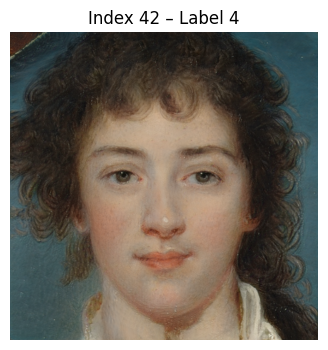

In [29]:
show_image_by_index(42)

### Generating the 'Average Face' of each Subtype

In [48]:
def get_means():
    labels = np.unique(y_labels)
    n_panels = 7
    cols = min(7, 3)  
    rows = int(np.ceil(7 / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = np.array(axes).reshape(-1)
    if rows * cols == 1:
        axes = np.array([axes])

    for i,label in enumerate(labels[:n_panels]):
        matching_idxs = np.where(y_labels == label)[0]
        z = z_bns[matching_idxs]
        #calculating mean of features for all samples of label
        z_mean = z.mean(dim=0)
        z=z_mean.unsqueeze(0).cuda()
        img = generate_image(z, truncation=0.7, noise_mode='const')
        img_np = img.permute(1, 2, 0).cpu().numpy()   
        
        ax = axes[i]
        ax.imshow(img_np)
        ax.set_title(f'Label {label}', fontsize=10)
        ax.axis('off')

    for ax in axes[n_panels:]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

    


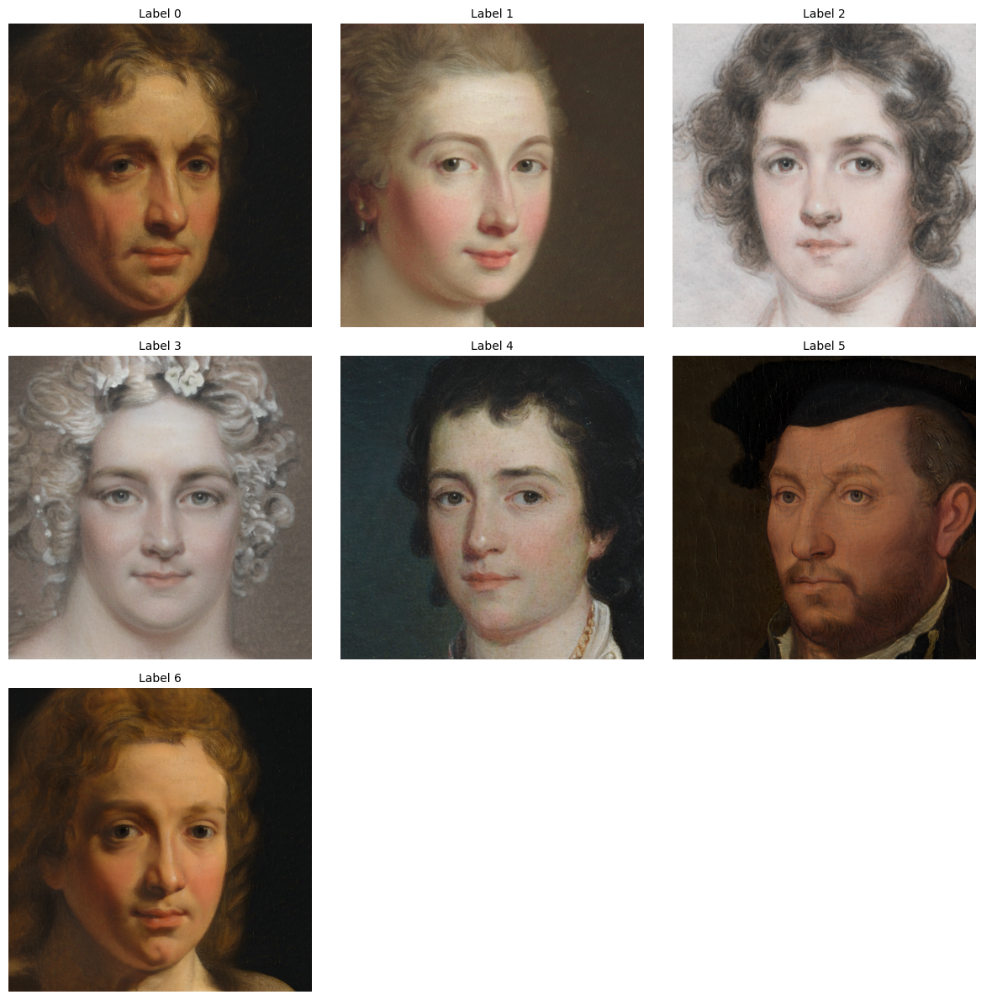

In [49]:
get_means()

### Prototype for Game

In [50]:
def query_image_by_index(idx):
    # same as show_image_by_index() but without showing the labels
    z = z_bns[idx].unsqueeze(0).cuda()      
    img = generate_image(z)              
    plt.figure(figsize=(4,4))
    plt.imshow(img.permute(1,2,0).cpu().numpy())
    plt.axis('off')
    plt.show()
    # asking for prediction from user 
    answer=int (input("Please enter Prediction:")) 
    if not (0 <= answer <= 6):
        print('input needs to be a number between 0-6')
        answer=int (input("Please enter Prediction:"))
    
    return answer==y_labels[idx]

In [51]:
def loop_query():
    sample_list = np.arange(len (y_labels)) 
    random.shuffle(sample_list)
    correct=0
    for i in sample_list [:5]:
        correct+= int(query_image_by_index(i)) 
    return f'Score: {correct / 5 * 100:.2f} %'

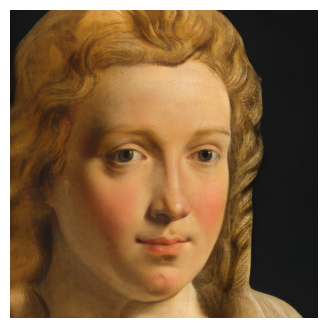

Please enter Prediction: 6


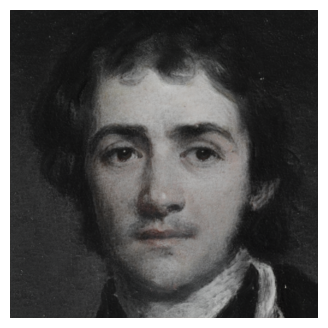

Please enter Prediction: 4


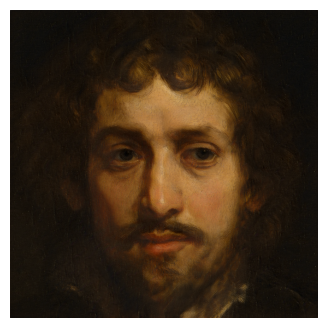

Please enter Prediction: 4


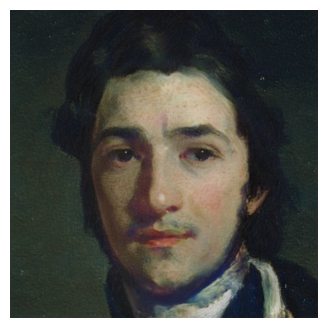

Please enter Prediction: 4


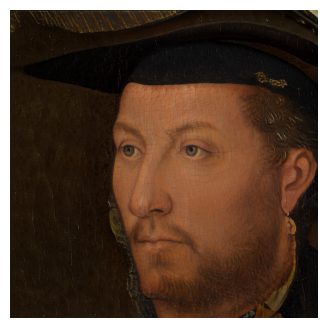

Please enter Prediction: 5


'Score: 60.00 %'

In [52]:
loop_query()

### Additional function to show as many Images of one Label you like

In [53]:
def show_first_n_per_label(label, n=5, truncation=0.7, noise_mode='random'):
    matching_idxs = np.where(y_labels == label)[0]

    if matching_idxs.size == 0:
        print(f' No Image with Label {label} found. Labels are 0-6')
        return
    selected_idxs = matching_idxs[:n]
    cols = min(len(selected_idxs), 3)  
    rows = int(np.ceil(len(selected_idxs) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))

    if rows * cols == 1:
        axes = np.array([axes])

    for ax, idx in zip(axes.flat, selected_idxs):
        z = z_bns[idx].unsqueeze(0).cuda()

        with torch.no_grad():
            img = generate_image(z, truncation=truncation, noise_mode=noise_mode)

        img_np = img.permute(1, 2, 0).cpu().numpy()   

        ax.imshow(img_np)
        #uncomment following line to show matching labels of images
        #ax.set_title(f'Idx {idx}\nTrue Label {label}\nPredicted Label {pred_labels[idx]} ', fontsize=10)
        ax.axis('off')

    for ax in axes.flat[len(selected_idxs):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()


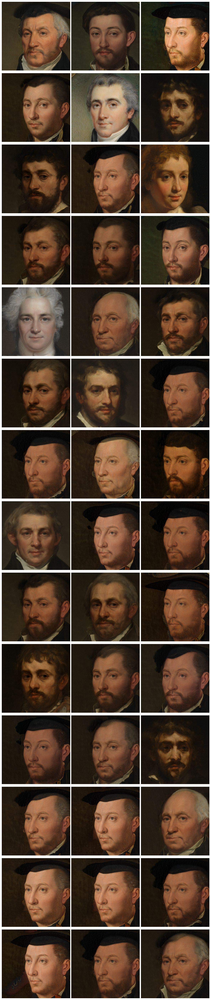

In [55]:
show_first_n_per_label(label=5, n=42)